In [52]:
#Transformaciones 
import pandas as pd
ruta = r"C:\Users\favil\ProjecteData\Equip_16\Data\dataset_16.09.csv"
trans = pd.read_csv(ruta)
trans[trans["age"]<18]

,id,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,deposit
1181,1182,0,management,married,tertiary,no,309,yes,no,cellular,5,feb,676,1,-1,0,unknown,yes
1410,1411,0,blue-collar,married,primary,no,4979,no,no,telephone,6,apr,180,1,-1,0,unknown,yes
4019,4020,0,services,single,secondary,no,1934,no,no,cellular,29,sep,271,1,-1,0,unknown,yes
5680,5681,0,technician,single,tertiary,no,720,no,no,cellular,12,aug,234,4,-1,0,unknown,no
6763,6764,0,technician,single,tertiary,no,686,yes,no,unknown,30,may,98,2,-1,0,unknown,no
8419,8420,0,blue-collar,married,secondary,no,1782,yes,no,unknown,19,jun,549,1,-1,0,unknown,no
9470,9471,0,management,married,tertiary,no,552,no,no,cellular,28,jul,761,8,-1,0,unknown,no
9552,9553,0,admin.,married,secondary,no,1648,yes,no,cellular,19,nov,172,3,-1,0,unknown,no
9751,9752,0,services,married,primary,no,2567,yes,no,cellular,14,may,109,1,360,2,failure,no
10678,10679,0,technician,divorced,tertiary,no,0,yes,no,cellular,2,jun,72,1,-1,0,unknown,no


In [53]:
def clase_edad(x):
    if x < 18:
        return "unknown"
    elif x >= 18 and x <=24: 
        return '18-24'
    elif  x >= 25 and x <= 34:
        return '25-34'
    elif  x >= 35 and x <= 44:
        return '35-44'
    elif  x >= 45 and x <= 54:
        return '45-54'
    elif  x >= 55 and x <= 64:
        return '55-64'
    else:
        return '65+' #Como no hay edades inferiores a 18 no va dar problemae

trans['Clase de edad'] = trans['age'].apply(clase_edad)
trans # Para visualizar la tabla generada


,id,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,deposit,Clase de edad
0,1,59,admin.,married,secondary,no,2343,yes,no,unknown,5,may,1042,1,-1,0,unknown,yes,55-64
1,2,56,admin.,married,secondary,no,45,no,no,unknown,5,may,1467,1,-1,0,unknown,yes,55-64
2,3,41,technician,married,secondary,no,1270,yes,no,unknown,5,may,1389,1,-1,0,unknown,yes,35-44
3,4,55,services,married,secondary,no,2476,yes,no,unknown,5,may,579,1,-1,0,unknown,yes,55-64
4,5,54,admin.,married,tertiary,no,184,no,no,unknown,5,may,673,2,-1,0,unknown,yes,45-54
5,6,42,management,single,tertiary,no,0,yes,yes,unknown,5,may,562,2,-1,0,unknown,yes,35-44
6,7,56,management,married,tertiary,no,830,yes,yes,unknown,6,may,1201,1,-1,0,unknown,yes,55-64
7,8,60,retired,divorced,secondary,no,545,yes,no,unknown,6,may,1030,1,-1,0,unknown,yes,55-64
8,9,37,technician,married,secondary,no,1,yes,no,unknown,6,may,608,1,-1,0,unknown,yes,35-44
9,10,28,services,single,secondary,no,5090,yes,no,unknown,6,may,1297,3,-1,0,unknown,yes,25-34


In [54]:
trans.to_csv(r"C:\Users\favil\ProjecteData\Equip_16\Borrador\Perfil de cliente\transformada_perfil_cliente.csv", index=False)

In [ ]:
#py -3.13 -m pip install KModes

Initialization method and algorithm are deterministic. Setting n_init to 1.
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 32070.0
Initialization method and algorithm are deterministic. Setting n_init to 1.
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 30563.0
Initialization method and algorithm are deterministic. Setting n_init to 1.
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 29202.0
Initialization method and algorithm are deterministic. Setting n_init to 1.
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100, moves: 0, cost: 28352.0
Initialization method and algorithm are deterministic. Setting n_init to 1.
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run 1, iteration: 1/100,

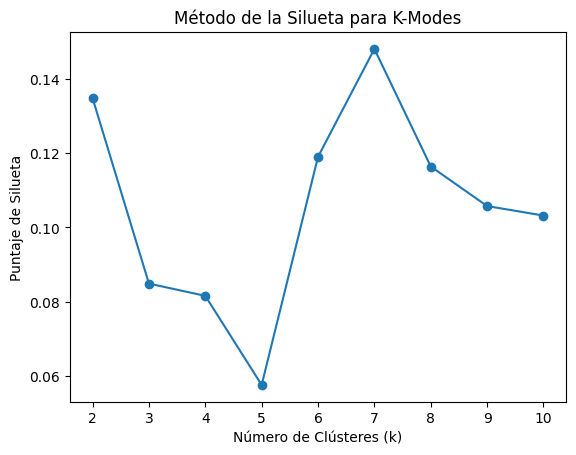

In [43]:
from sklearn.metrics import silhouette_score
from kmodes.kmodes import KModes
import pandas as pd
import matplotlib.pyplot as plt

ruta = r"C:\Users\favil\ProjecteData\Equip_16\Data\dataset_16.09.csv"
trans = pd.read_csv(ruta)
trans = trans[["age","job","marital","education","housing","loan"]]

# Convertir las columnas categóricas a categorías numéricas usando pd.get_dummies
df_encoded = pd.get_dummies(trans)

# Probar diferentes valores de k (número de clusters)
silhouette_scores = []

for k in range(2, 11):  # Para que funcione, k debe ser al menos 2
    kmeans = KModes(n_clusters=k, init='Cao', n_init=10, verbose=1, random_state=42)
    clusters = kmeans.fit_predict(trans)
    
    # Calcular el puntaje de la silueta con la métrica de Hamming
    score = silhouette_score(df_encoded, clusters, metric='hamming')
    silhouette_scores.append(score)

# Graficar la silueta
plt.plot(range(2, 11), silhouette_scores, marker='o')
plt.title('Método de la Silueta para K-Modes')
plt.xlabel('Número de Clústeres (k)')
plt.ylabel('Puntaje de Silueta')
plt.show()

      age            job   marital  education housing loan  Cluster
0      59         admin.   married  secondary     yes   no        3
1      56         admin.   married  secondary      no   no        0
2      41     technician   married  secondary     yes   no        2
3      55       services   married  secondary     yes   no        4
4      54         admin.   married   tertiary      no   no        0
5      42     management    single   tertiary     yes  yes        1
6      56     management   married   tertiary     yes  yes        1
7      60        retired  divorced  secondary     yes   no        3
8      37     technician   married  secondary     yes   no        2
9      28       services    single  secondary     yes   no        1
10     38         admin.    single  secondary     yes   no        3
11     30    blue-collar   married  secondary     yes   no        4
12     29     management   married   tertiary     yes  yes        1
13     46    blue-collar    single   tertiary   

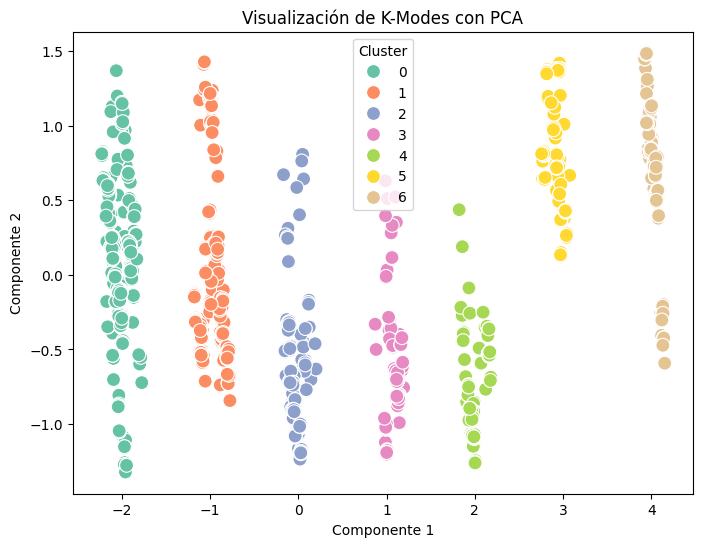

Pesos (cargas) de cada variable en los componentes principales:
                          PC1       PC2
Cluster              0.983061  0.047266
age_0                0.000135  0.000023
age_18               0.000668  0.001350
age_19               0.001092  0.001959
age_20               0.001373  0.002259
age_21               0.002109  0.003722
age_22               0.003109  0.006033
age_23               0.002852  0.003665
age_24               0.003682  0.003395
age_25               0.006512  0.010540
age_26               0.010811  0.014240
age_27               0.005397  0.010173
age_28               0.005410  0.009972
age_29               0.004529  0.008546
age_30               0.005208  0.015096
age_31              -0.010283  0.003028
age_32              -0.002438  0.000296
age_33               0.004499  0.004738
age_34               0.000991 -0.006902
age_35              -0.000296 -0.005380
age_36              -0.000490 -0.000365
age_37              -0.000454 -0.003348
age_38          

In [51]:
import pandas as pd
from kmodes.kmodes import KModes
from sklearn.decomposition import PCA
from sklearn.preprocessing import LabelEncoder
import seaborn as sns

df_encoded = pd.get_dummies(trans)
# Convertir las columnas a tipo categórico (si aún no lo son)
for col in trans.columns:
    trans[col] = trans[col].astype('category')

# Inicializar el modelo K-Modes
kmeans = KModes(n_clusters=7, init='Cao', n_init=10, verbose=0, random_state=42)

# Aplicar el K-Modes al dataframe
clusters = kmeans.fit_predict(trans)

# Mostrar el dataframe con los clusters asignados
trans['Cluster'] = clusters

# Ver los resultados
print(trans)

# Ver los centroides de los clusters
print("Centroides de los clusters: ")
print(kmeans.cluster_centroids_)

trans["Cluster"].value_counts() #Para ver el reparto de grupos por clústers

# Reducir dimensiones para visualización
pca = PCA(n_components=2)
components = pca.fit_transform(df_encoded)

# Crear DataFrame para graficar
plot_df = pd.DataFrame(data=components, columns=['Componente 1', 'Componente 2'])
plot_df['Cluster'] = clusters

# Graficar
plt.figure(figsize=(8, 6))
sns.scatterplot(data=plot_df, x='Componente 1', y='Componente 2', hue='Cluster', palette='Set2', s=100)
plt.title('Visualización de K-Modes con PCA')
plt.show()
pca.explained_variance_ratio_
loadings = pd.DataFrame(
    pca.components_.T,  # transponer para que cada fila sea una variable
    index=df_encoded.columns,
    columns=[f'PC{i+1}' for i in range(pca.n_components_)]
)

print("Pesos (cargas) de cada variable en los componentes principales:")
print(loadings)

In [25]:
trans["job"].value_counts()

job
management       2566
blue-collar      1944
technician       1823
admin.           1334
services          923
retired           778
self-employed     405
student           360
unemployed        357
entrepreneur      328
housemaid         274
unknown            70
Name: count, dtype: int64

In [24]:
trans["education"].value_counts()

education
secondary    5474
tertiary     3685
primary      1500
unknown       503
Name: count, dtype: int64

In [26]:
trans["marital"].value_counts()

marital
married     6349
single      3517
divorced    1291
unknown        5
Name: count, dtype: int64

In [32]:
pd.options.display.max_rows = None
trans["age"].value_counts()


age
31    496
32    476
34    466
33    463
35    461
30    456
36    432
37    370
38    353
39    343
29    327
40    325
41    299
42    295
28    292
46    258
47    255
45    253
43    248
27    246
49    241
44    237
26    234
48    214
53    204
52    204
55    197
51    194
50    193
54    187
57    184
59    184
56    177
60    169
25    167
58    159
24     95
23     68
61     66
22     48
62     45
63     38
64     37
77     31
21     30
67     29
66     29
73     29
72     28
65     27
71     27
68     24
70     23
76     21
69     20
20     20
78     19
74     18
75     18
80     17
19     13
79     10
0      10
82     10
81      9
18      8
83      7
84      5
85      5
86      5
87      4
88      2
90      2
93      2
92      2
89      1
95      1
Name: count, dtype: int64